In this project, we are looking at the biasing problem, when we have different size of dta in different categories. SO, It might effect on our final prediction.

We can understand the issue more by looking at the data. Let's do that

# Load the data

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
 
data = pd.read_csv('demographic_attributes.csv', header=0)

data1 = pd.read_csv('demo_ground_truth_csv.csv', header=0)

data.head()

,person id,age,education,ethnicity
0,0,75_84,Some College,white
1,1,85_120,HS Diploma,white
2,2,25_34,Some College,white
3,3,55_64,HS Diploma,black
4,4,45_54,Bachelor Degree,white


Store the array of indecies which we have nan in the data

In [2]:
data
nan_array=pd.isnull(data).any(1).nonzero()[0]

In [3]:
data.shape

(400000, 4)

In [4]:
data.shape[0]

400000

# data visualization

we can simply see that the data is biased by looking at the number of data for each category in both files

In [5]:
age = data1.loc[0:11]
education = data1.loc[12:16]
ethn = data1.loc[17:21]

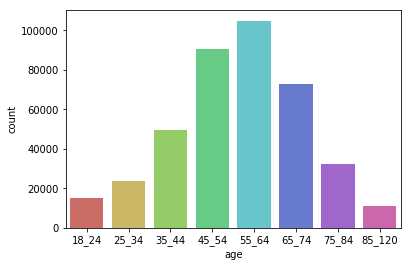

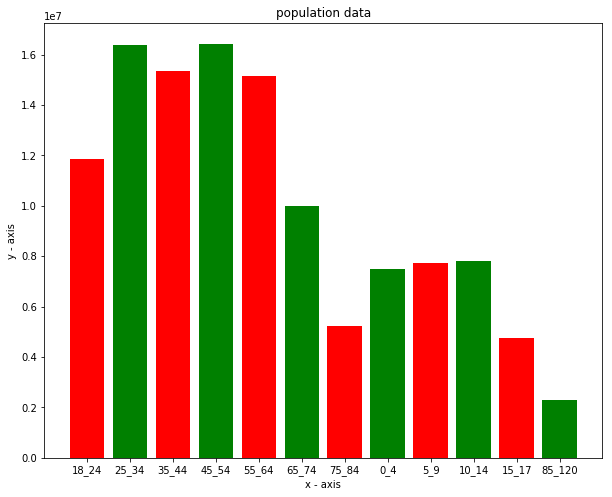

In [6]:
sns.countplot(x="age", data=data, palette='hls')
plt.show()
plt.figure(figsize=(10,8))
plt.bar(age['demographic category'], age['number of individuals'], tick_label = age['demographic category'], 
        width = 0.8, color = ['red', 'green']) 
  
# naming the x-axis 
plt.xlabel('x - axis') 
# naming the y-axis 
plt.ylabel('y - axis') 
# plot title 
plt.title('population data') 
  
# function to show the plot 
plt.show() 

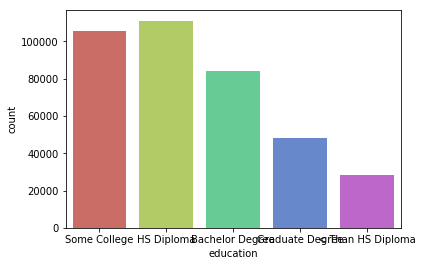

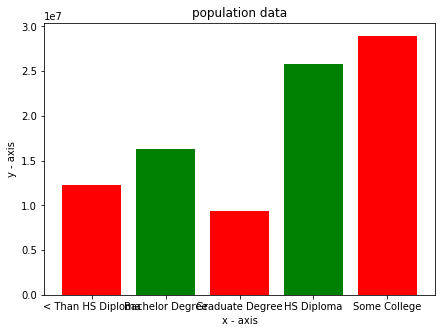

In [7]:
sns.countplot(x="education", data=data, palette='hls')

plt.show()
plt.figure(figsize=(7,5))
plt.bar(education['demographic category'], education['number of individuals'], tick_label = education['demographic category'], 
        width = 0.8, color = ['red', 'green']) 
  
# naming the x-axis 
plt.xlabel('x - axis') 
# naming the y-axis 
plt.ylabel('y - axis') 
# plot title 
plt.title('population data') 
  
# function to show the plot 
plt.show() 

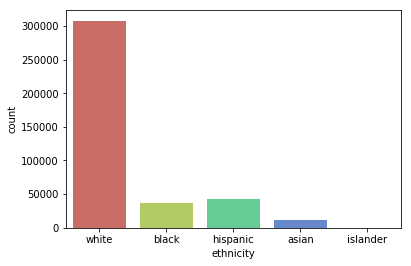

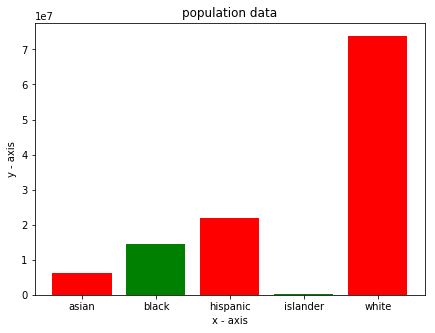

In [8]:
sns.countplot(x="ethnicity", data=data, palette='hls')

plt.show()
plt.figure(figsize=(7,5))
plt.bar(ethn['demographic category'], ethn['number of individuals'], tick_label = ethn['demographic category'], 
        width = 0.8, color = ['red', 'green']) 
  
# naming the x-axis 
plt.xlabel('x - axis') 
# naming the y-axis 
plt.ylabel('y - axis') 
# plot title 
plt.title('population data') 
  
# function to show the plot 
plt.show() 

In [10]:
x=data.loc[0]
x

person id               0
age                 75_84
education    Some College
ethnicity           white
Name: 0, dtype: object

In [13]:
t=data.groupby(['age','education','ethnicity']).count()
t.sum().tolist()[0]

377810

In [14]:
t=data.groupby(['age','education','ethnicity']).count()
y=t.loc[x[1]].loc[x[2]].loc[x[3]]
print(y)
y1=y/data.shape[0]
y1=y1.tolist()[0]
y1

person id    4865
Name: white, dtype: int64


0.0121625

In [16]:
data1.loc[0:11]
t=data1.sum(axis = 0, skipna = True)
age_sum=t['number of individuals']

data1.loc[12:16]
t=data1.sum(axis = 0, skipna = True)
education_sum=t['number of individuals']

data1.loc[17:21]
t=data1.sum(axis = 0, skipna = True)
ethn_sum=t['number of individuals']

print(age_sum)
print(education_sum)
print(ethn_sum)

329895430
329895430
329895430


In [17]:
data1 = pd.read_csv('demo_ground_truth_csv.csv' , header=0)
p1 = data1.loc[data1['demographic category'] == x[1], 'number of individuals']
pop_percent_age = p1.tolist()[0]/age_sum

p2 = data1.loc[data1['demographic category'] == x[2], 'number of individuals']
pop_percent_education = p2.tolist()[0]/education_sum

p3 = data1.loc[data1['demographic category'] == x[3], 'number of individuals']
pop_percent_ethn = p3.tolist()[0]/ethn_sum

print(pop_percent_age)
print(pop_percent_education)
print(pop_percent_ethn)


0.015827530560214187
0.0877161165888233
0.22382294898719876


In [18]:
weight = (pop_percent_age*pop_percent_education*pop_percent_ethn)/y1
weight

0.025549024166254833

weigting data is an approach for solving the problem of biasing.

In the demographic_attribute data, we have person's id and the attributes in the sample data.
In the demo_ground_truth data, we have the total number of each category in the population data.

The method called postratification.

For each id, we will do the following procedure.
1) Count the number of sample with the same three attributes
2) calculate the probability of having a person with these attributes in the sample data that is (the number of persons with the attributes in sample data/ the total number of persons in the sample data)
3) calculate the probability of having a person with these attributes in the population data.
*becasue the attributes are independent, P(A,B,C)=P(A)*P(B)*P(C)
so for example, p(age=14-24,education-level=graduate, ethnicity=white)= p(age=14-24)*p(education-level=graduate)* p(ethnicity=white)
Also, p(age=14-24)= (the number of data with age=14-24)/(the total number of data in the population)

4) weight = probability in population/ probability in sample

# calculate the sum of the data in population

In [19]:
data1.loc[0:11]
t=data1.sum(axis = 0, skipna = True)
age_sum=t['number of individuals']

data1.loc[12:16]
t=data1.sum(axis = 0, skipna = True)
education_sum=t['number of individuals']

data1.loc[17:21]
t=data1.sum(axis = 0, skipna = True)
ethn_sum=t['number of individuals']

# Calculate the weights

In [20]:
new_data5 = pd.DataFrame(columns=['id','weight'])

t=data.groupby(['age','education','ethnicity']).count()

for i in range(data.shape[0]):

    if i in nan_array:
        continue
    #print(i)
    x=data.loc[i] 
    
    y=t.loc[x[1]].loc[x[2]].loc[x[3]]
    y1=y/t.sum().tolist()[0]
    y1=y1.tolist()[0]
    
    
    p1 = data1.loc[data1['demographic category'] == x[1], 'number of individuals']
    pop_percent_age = p1.tolist()[0]/age_sum

    p2 = data1.loc[data1['demographic category'] == x[2], 'number of individuals']
    pop_percent_education = p2.tolist()[0]/education_sum

    p3 = data1.loc[data1['demographic category'] == x[3], 'number of individuals']
    pop_percent_ethn = p3.tolist()[0]/ethn_sum
    
    
    weight = (pop_percent_age*pop_percent_education*pop_percent_ethn)/y1
    
    #print(weight)
    
    new_data5 = new_data5.append({'id': i, 'weight': weight}, ignore_index=True)
    
new_data5.to_csv(index=False)    

'id,weight\n0.0,0.024131692050631846\n1.0,0.012653483359480003\n2.0,0.06875550320161458\n3.0,0.01493768758205992\n4.0,0.0125118651659291\n5.0,0.1249991308903067\n6.0,0.018217417169545332\n7.0,0.023310102443983995\n8.0,0.028038371444586735\n9.0,0.024131692050631846\n10.0,0.027038824823457302\n11.0,0.018217417169545332\n12.0,0.008963007234209832\n13.0,0.024178664479262143\n14.0,0.028038371444586735\n15.0,0.06875550320161458\n16.0,0.06875550320161458\n17.0,0.023310102443983995\n19.0,0.01493768758205992\n20.0,0.01493768758205992\n21.0,0.01493768758205992\n22.0,0.029446113481332133\n23.0,0.029446113481332133\n24.0,0.029446113481332133\n25.0,0.05397171750448237\n26.0,0.018217417169545332\n27.0,0.018217417169545332\n28.0,0.011355465594308646\n29.0,0.011355465594308646\n30.0,0.045786250694491\n32.0,0.011973543971046746\n33.0,0.011973543971046746\n34.0,0.018217417169545332\n35.0,0.009959498937270822\n36.0,0.010395983181176691\n37.0,0.010395983181176691\n39.0,0.045786250694491\n40.0,0.0099594989

In [238]:
new_data3.weight<1
new_data3.loc[new_data3['weight'] < 1, 'weight']

26155     0.603087
26975     0.603087
34277     0.423580
34751     0.423580
38987     0.423580
47017     0.423580
49825     0.423580
65762     0.423580
70954     0.423580
111296    0.221908
113467    0.332654
124737    0.603087
129701    0.423580
140066    0.423580
160477    0.423580
169767    0.332654
187323    0.332654
205796    0.603087
206400    0.423580
213814    0.423580
228830    0.221908
236172    0.423580
249078    0.332654
252839    0.423580
265386    0.332654
291083    0.423580
296292    0.221908
304863    0.603087
324019    0.423580
326879    0.332654
331630    0.221908
333350    0.423580
338104    0.603087
343437    0.423580
346791    0.332654
365532    0.423580
368927    0.332654
374217    0.332654
374218    0.423580
Name: weight, dtype: float64